<a href="https://colab.research.google.com/github/kdChen07/LSCP_kd/blob/main/map_12.17.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install inequality
!pip install libpysal
!pip install geopandas
!pip install mapclassify

  Created wheel for inequality: filename=inequality-1.0.0-py3-none-any.whl size=11799 sha256=2ea0b8c70ca813428b34fcbefb23e85bc82d6adb33210eaaaff4665238a33c5b
  Stored in directory: /root/.cache/pip/wheels/a8/81/7a/af8b9e8ea0b034ac1bdd9d68f3a8ceac179eb5418cdb83c851
Successfully built inequality
     |████████████████████████████████| 2.4 MB 7.4 MB/s 
     |████████████████████████████████| 1.0 MB 7.4 MB/s 
     |████████████████████████████████| 15.4 MB 42.7 MB/s 
     |████████████████████████████████| 6.3 MB 17.4 MB/s 


In [ ]:
import mapclassify
from google.colab import files 
import pandas
import numpy

In [ ]:
import sys
import os
import matplotlib.pyplot as plt
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [ ]:
sys.path.append(os.path.abspath('..'))
import inequality
import libpysal

In [ ]:
from matplotlib.patches import Patch
import matplotlib.lines as mlines

##第一部分

#读取MSOA数据

In [ ]:
import geopandas

gdf = geopandas.read_file('https://github.com/LingruFeng/dissertation/blob/main/data_github/England_basemap/MSOA_Boundary_with_population.gpkg?raw=true')
gdf = gdf.to_crs('epsg:4326')
from libpysal.weights import Queen, Rook, KNN

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
tract = geopandas.read_file('https://github.com/LingruFeng/dissertation/blob/main/data_github/England_basemap/MSOA_Boundary_with_population.gpkg?raw=true')
tract = tract.to_crs('epsg:4326')

In [ ]:
gdf['dissolve']=1
MSOA_outline = gdf.dissolve(by='dissolve')

#读入能为MSOA提供疫苗服务的原有疫苗站数量

In [ ]:
a=pandas.read_csv('https://github.com/kdChen07/LSCP_kd/blob/main/data2/before_optimisation.csv?raw=true')
a

,origin_id,number
0,E02000001,623
1,E02000002,69
2,E02000003,68
3,E02000004,42
4,E02000005,73
...,...,...
6403,E02006930,453
6404,E02006931,516
6405,E02006932,14
6406,E02006933,13


#将地图数据和能提供疫苗站数量拼接

In [ ]:
gdf1 = pandas.merge(left = gdf,right = a, how='left', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
gdf1['number'].fillna(0, inplace=True)
gdf1

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,dissolve,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",1,E02000001,623.0
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",1,E02000002,69.0
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",1,E02000003,68.0
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",1,E02000004,42.0
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",1,E02000005,73.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6786,E02006930,Greenwich 037,7425,741,473,305,167,16,9127,"POLYGON ((0.02331 51.48469, 0.02018 51.48441, ...",1,E02006930,453.0
6787,E02006931,Greenwich 038,7267,1024,672,510,255,78,9806,"POLYGON ((-0.00284 51.48251, 0.00141 51.48214,...",1,E02006931,516.0
6788,E02006932,Liverpool 060,16963,264,173,80,25,10,17515,"POLYGON ((-2.96793 53.41177, -2.96814 53.40874...",1,E02006932,14.0
6789,E02006933,Liverpool 061,7130,603,485,220,97,4,8539,"POLYGON ((-2.97760 53.39957, -2.98328 53.39717...",1,E02006933,13.0


#基尼系数

In [ ]:
gini_1 = inequality.gini.Gini(gdf1['number'])

In [ ]:
gini_1.g

0.8371008749630625

In [ ]:
tract1=pandas.merge(left = gdf,right = a, how='right', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
data = geopandas.read_file(r'Major_Towns_and_Cities_December_2015_Boundaries.shp')

In [ ]:
pandas.set_option('display.max_columns', None)
data

,objectid,tcity15cd,tcity15nm,st_areasha,st_lengths,geometry
0,1,J01000001,Barnsley,2.568247e+07,115099.860000,"POLYGON ((-1.51420 53.59640, -1.51344 53.59640..."
1,2,J01000002,Basildon,2.551499e+07,119299.838000,"MULTIPOLYGON (((0.47826 51.59572, 0.47829 51.5..."
2,3,J01000003,Basingstoke,2.918502e+07,93900.388003,"POLYGON ((-1.04625 51.29205, -1.04696 51.29205..."
3,9,J01000009,Blackpool,3.446999e+07,82999.962000,"MULTIPOLYGON (((-3.01745 53.84159, -3.01669 53..."
4,4,J01000004,Bath,2.423750e+07,92099.940000,"MULTIPOLYGON (((-2.37806 51.40636, -2.37878 51..."
...,...,...,...,...,...,...
107,106,J01000106,Weston-Super-Mare,1.883999e+07,74499.992000,None
108,109,J01000109,Wolverhampton,5.932501e+07,131300.020000,None
109,110,J01000110,Worcester,2.423248e+07,89800.048000,None
110,111,J01000111,Worthing,2.458249e+07,47000.022000,None


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
data.to_csv('major_town.csv')

In [ ]:
data

,objectid,tcity15cd,tcity15nm,st_areasha,st_lengths,geometry
0,1,J01000001,Barnsley,2.568247e+07,115099.860000,"POLYGON ((-1.51420 53.59640, -1.51344 53.59640..."
1,2,J01000002,Basildon,2.551499e+07,119299.838000,"MULTIPOLYGON (((0.47826 51.59572, 0.47829 51.5..."
2,3,J01000003,Basingstoke,2.918502e+07,93900.388003,"POLYGON ((-1.04625 51.29205, -1.04696 51.29205..."
3,9,J01000009,Blackpool,3.446999e+07,82999.962000,"MULTIPOLYGON (((-3.01745 53.84159, -3.01669 53..."
4,4,J01000004,Bath,2.423750e+07,92099.940000,"MULTIPOLYGON (((-2.37806 51.40636, -2.37878 51..."
...,...,...,...,...,...,...
107,106,J01000106,Weston-Super-Mare,1.883999e+07,74499.992000,None
108,109,J01000109,Wolverhampton,5.932501e+07,131300.020000,None
109,110,J01000110,Worcester,2.423248e+07,89800.048000,None
110,111,J01000111,Worthing,2.458249e+07,47000.022000,None


In [ ]:
data_new=data[['tcity15cd','tcity15nm','geometry']]
data_new

In [ ]:
data_del19=data_new.drop([19])

In [ ]:
data_del19

In [ ]:
data_new.to_csv('2.csv')
files.download('2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
tract11 =tract1.loc[tract1['number']==0]
tract12 =tract1.loc[tract1['number']==1]
tract13 =tract1.loc[tract1['number']==2]
tract14 =tract1.loc[(tract1['number']>=3)&(tract1['number']<7)]
tract15 =tract1.loc[(tract1['number']>=7)&(tract1['number']<19)]
tract16 =tract1.loc[(tract1['number']>=19)&(tract1['number']<660)]

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


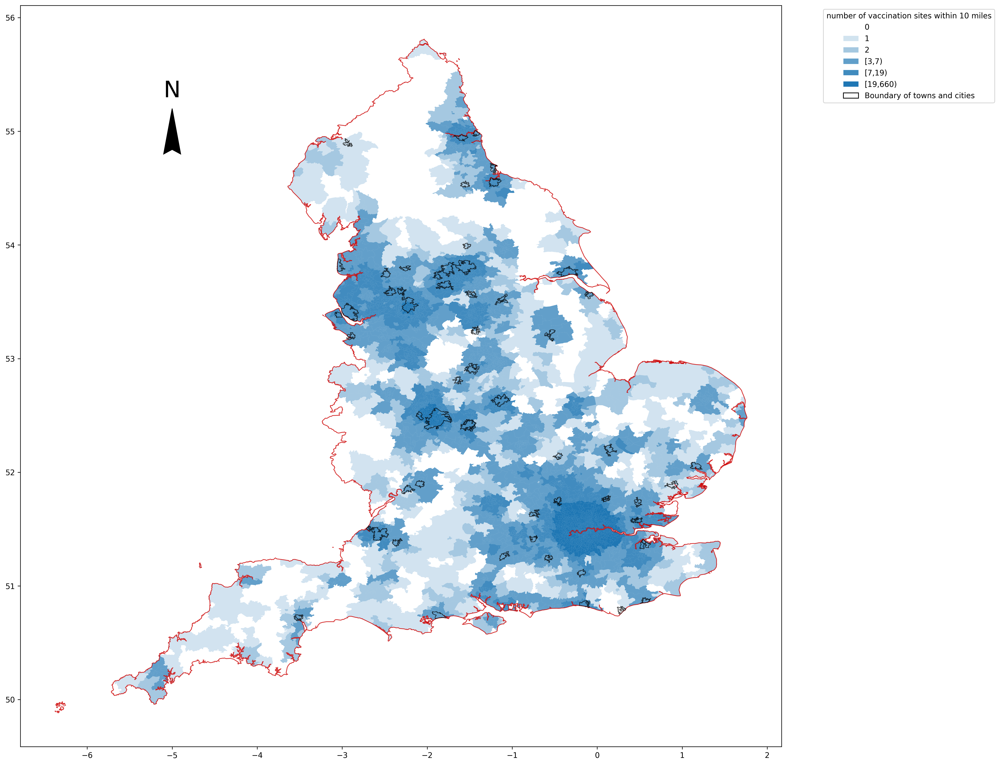

In [ ]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=300)
    legend_elements = []
    tract11.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract12.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract13.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract14.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract15.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract16.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    data_del19.plot(figsize=(18,18),ax=ax,zorder=2,facecolor='none',edgecolor='k',linewidth=0.7,alpha=0.7)

    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)

    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')

    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    legend_elements.append(Patch(zorder=2,facecolor='none',edgecolor='k',label='Boundary of towns and cities'))  

    plt.gca().set_aspect('auto')
    plt.legend(handles = legend_elements, loc='upper left',title='number of vaccination sites within 10 miles',bbox_to_anchor=(1.05, 1))

##第二部分

In [ ]:
facility_points = pandas.read_csv('https://github.com/kdChen07/LSCP_kd/blob/main/data2/lscp_1_point.csv?raw=true')
facility_points

,name_id,name,point_lon,point_lat,index
0,682,Axbridge Pharmacy,-2.817315,51.286887,74
1,692,Torrington Hospital,-4.136968,50.954726,76
2,804,Boots,-0.733159,53.752808,95
3,929,Rowbotham Pharmacy,-0.012834,53.683643,108
4,930,Holme Pharmacy,-0.765928,53.836858,109
...,...,...,...,...,...
123,17685,Community Midwives,-2.494133,54.578967,2311
124,17811,Karuna Teachings Ltd,-3.808379,50.605729,2330
125,18502,Helen Howells,-1.768067,52.089126,2409
126,19332,Abbey Hearing Clinics,-2.274283,51.037320,2491


In [ ]:
facility_points_gdf = geopandas.GeoDataFrame(
    facility_points,
    geometry=geopandas.points_from_xy(
        facility_points.point_lon, facility_points.point_lat
    ),
).sort_values(by=['index']).reset_index()

In [ ]:
facility_points_gdf

,level_0,name_id,name,point_lon,point_lat,index,geometry
0,0,682,Axbridge Pharmacy,-2.817315,51.286887,74,POINT (-2.81732 51.28689)
1,1,692,Torrington Hospital,-4.136968,50.954726,76,POINT (-4.13697 50.95473)
2,2,804,Boots,-0.733159,53.752808,95,POINT (-0.73316 53.75281)
3,3,929,Rowbotham Pharmacy,-0.012834,53.683643,108,POINT (-0.01283 53.68364)
4,4,930,Holme Pharmacy,-0.765928,53.836858,109,POINT (-0.76593 53.83686)
...,...,...,...,...,...,...,...
123,123,17685,Community Midwives,-2.494133,54.578967,2311,POINT (-2.49413 54.57897)
124,124,17811,Karuna Teachings Ltd,-3.808379,50.605729,2330,POINT (-3.80838 50.60573)
125,125,18502,Helen Howells,-1.768067,52.089126,2409,POINT (-1.76807 52.08913)
126,126,19332,Abbey Hearing Clinics,-2.274283,51.037320,2491,POINT (-2.27428 51.03732)


In [ ]:
facility_points2 = pandas.read_csv('https://github.com/kdChen07/LSCP_kd/blob/main/data2/lscp_2_point.csv?raw=true')
facility_points2

,index,geometry,point_lon,point_lat
0,0,POINT (-0.4712113874118363 52.12862228931041),-0.471211,52.128622
1,7,POINT (0.1368829128524223 52.17306738934595),0.136883,52.173067
2,13,POINT (0.08580921260311332 51.77104988900619),0.085809,51.771050
3,17,POINT (0.4469670132963284 52.75661518984963),0.446967,52.756615
4,18,POINT (1.756302113577515 52.47670668959817),1.756302,52.476707
...,...,...,...,...
296,1544,POINT (-1.5266332877796 52.34019078951223),-1.526633,52.340191
297,1548,POINT (-0.06975898678765348 52.97716399005937),-0.069759,52.977164
298,1572,POINT (-2.244461687490209 53.78969949093244),-2.244462,53.789699
299,1592,POINT (-1.800299788570546 51.07008258839585),-1.800300,51.070083


In [ ]:
facility_points_gdf2 = geopandas.GeoDataFrame(
    facility_points2,
    geometry=geopandas.points_from_xy(
        facility_points2.point_lon, facility_points2.point_lat
    ),
).sort_values(by=['index']).reset_index()

In [ ]:
facility_points_gdf2

,level_0,index,geometry,point_lon,point_lat
0,0,0,POINT (-0.47121 52.12862),-0.471211,52.128622
1,1,7,POINT (0.13688 52.17307),0.136883,52.173067
2,2,13,POINT (0.08581 51.77105),0.085809,51.771050
3,3,17,POINT (0.44697 52.75662),0.446967,52.756615
4,4,18,POINT (1.75630 52.47671),1.756302,52.476707
...,...,...,...,...,...
296,296,1544,POINT (-1.52663 52.34019),-1.526633,52.340191
297,297,1548,POINT (-0.06976 52.97716),-0.069759,52.977164
298,298,1572,POINT (-2.24446 53.78970),-2.244462,53.789699
299,299,1592,POINT (-1.80030 51.07008),-1.800300,51.070083


#读入LSCP2优化后的能为MSOA提供疫苗服务的疫苗站数量

In [ ]:
b=pandas.read_csv('https://github.com/kdChen07/LSCP_kd/blob/main/data2/after_optimisation_lscp_2_number.csv?raw=true')
b

,origin_id,number
0,E02000001,2
1,E02000002,1
2,E02000003,1
3,E02000004,1
4,E02000005,1
...,...,...
6403,E02006930,1
6404,E02006931,1
6405,E02006932,2
6406,E02006933,2


In [ ]:
gdf2 = pandas.merge(left = gdf,right = b, how='right', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
tract2=pandas.merge(left = gdf,right = b, how='right', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
tract21 =tract2.loc[tract2['number']==0]
tract22 =tract2.loc[tract2['number']==1]
tract23 =tract2.loc[tract2['number']==2]
tract24 =tract2.loc[(tract2['number']>=3)&(tract2['number']<7)]
tract25 =tract2.loc[(tract2['number']>=7)&(tract2['number']<19)]
tract26 =tract2.loc[(tract2['number']>=19)&(tract2['number']<660)]

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


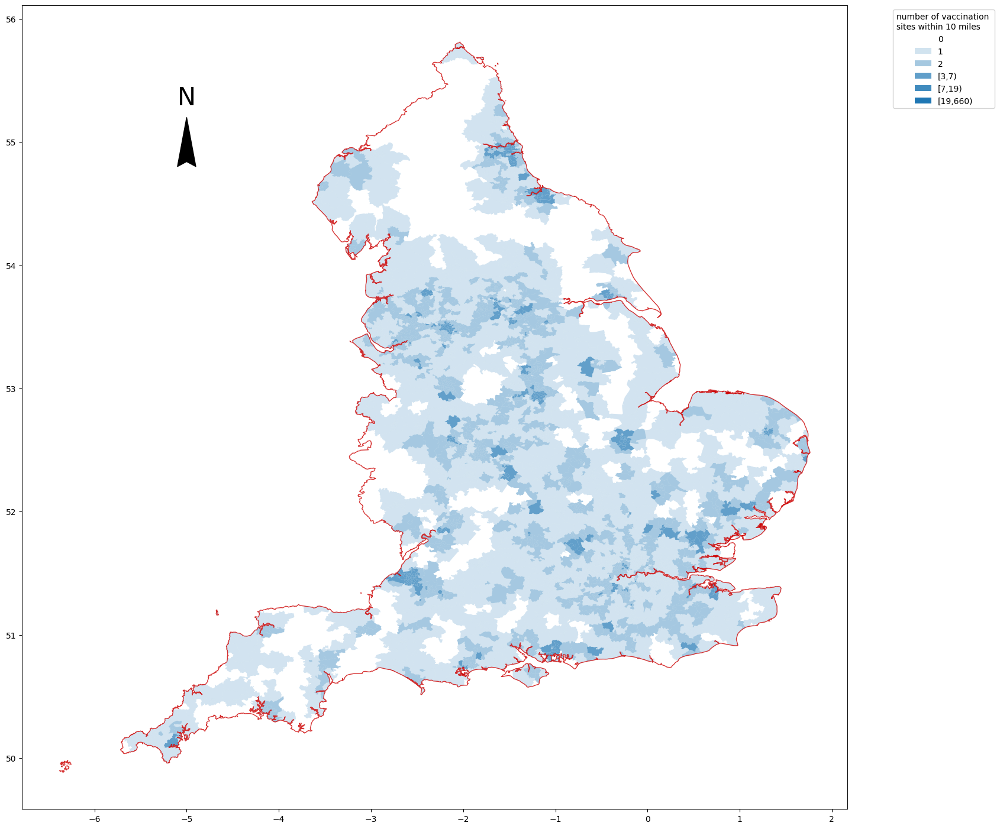

In [ ]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=100)
    legend_elements = []
    tract21.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract22.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract23.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract24.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract25.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract26.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)

    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)

    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')

    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    plt.gca().set_aspect('auto')
    plt.legend(handles = legend_elements, loc='upper left',title='number of vaccination \nsites within 10 miles',bbox_to_anchor=(1.05, 1))

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


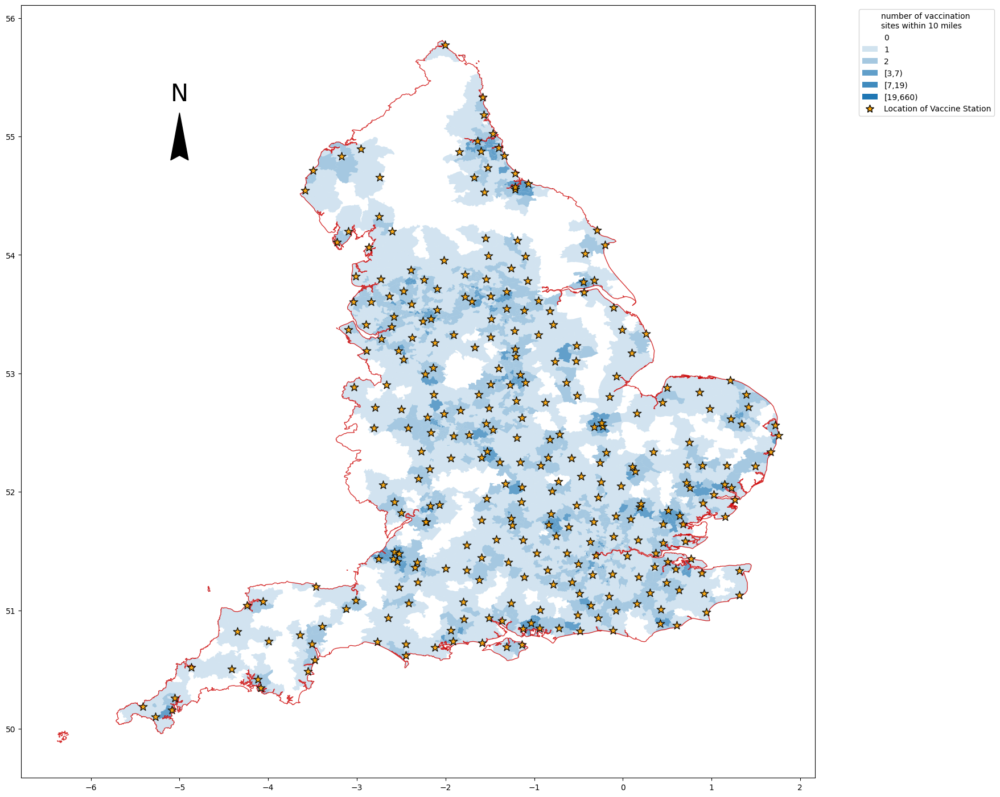

In [ ]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=100)
    legend_elements = []
    tract21.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract22.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract23.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract24.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract25.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract26.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    facility_points_gdf2.plot(ax=ax,
                marker="*",
                markersize=120,
                alpha=0.9,
                zorder=4,
                edgecolor="k",
                facecolor='orange')
    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    legend_elements.append(mlines.Line2D(
        [],
        [],
        color='orange',
        marker='*',
        markersize=10,
        markeredgecolor="k",
        linewidth=0,
        label='Location of Vaccine Station'
        ))
    plt.gca().set_aspect('auto')
    plt.legend(handles = legend_elements, loc='upper left',title='number of vaccination \nsites within 10 miles',bbox_to_anchor=(1.05, 1))

##第四种情况

#读入能为6788个（有3个MSOA无法得到服务）MSOA提供疫苗服务的经过LSCP1、LSCP2优化后的疫苗站数量number

In [ ]:
c=pandas.read_csv('https://github.com/kdChen07/LSCP_kd/blob/main/data2/after_optimisation.csv?raw=true')
c

,index,origin_id,number
0,0.0,E02000001,2
1,1.0,E02000002,1
2,2.0,E02000003,1
3,3.0,E02000004,1
4,4.0,E02000005,1
...,...,...,...
6783,NaN,E02006845,2
6784,NaN,E02006846,2
6785,NaN,E02006857,1
6786,NaN,E02006870,1


In [ ]:
gdf5 = pandas.merge(left = gdf,right = c, how='left', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
gdf5

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,dissolve,index,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",1,0.0,E02000001,2.0
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",1,1.0,E02000002,1.0
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",1,2.0,E02000003,1.0
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",1,3.0,E02000004,1.0
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",1,4.0,E02000005,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6786,E02006930,Greenwich 037,7425,741,473,305,167,16,9127,"POLYGON ((0.02331 51.48469, 0.02018 51.48441, ...",1,6403.0,E02006930,1.0
6787,E02006931,Greenwich 038,7267,1024,672,510,255,78,9806,"POLYGON ((-0.00284 51.48251, 0.00141 51.48214,...",1,6404.0,E02006931,1.0
6788,E02006932,Liverpool 060,16963,264,173,80,25,10,17515,"POLYGON ((-2.96793 53.41177, -2.96814 53.40874...",1,6405.0,E02006932,2.0
6789,E02006933,Liverpool 061,7130,603,485,220,97,4,8539,"POLYGON ((-2.97760 53.39957, -2.98328 53.39717...",1,6406.0,E02006933,2.0


In [ ]:
gdf5['number'].fillna(0, inplace=True)

#基尼系数

In [ ]:
gini_1600Z2 = inequality.gini.Gini(gdf5['number'])
gini_1600Z2.g

0.2314133268129151

In [ ]:
tract3=pandas.merge(left = gdf,right = c, how='left', left_on='MSOA11CD', right_on='origin_id')

In [ ]:
tract3['number'].fillna(0, inplace=True)
tract3

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,dissolve,index,origin_id,number
0,E02000001,City of London 001,6206,1339,1025,720,313,118,9721,"POLYGON ((-0.08519 51.52034, -0.07845 51.52151...",1,0.0,E02000001,2.0
1,E02000002,Barking and Dagenham 001,5621,835,505,401,268,105,7735,"POLYGON ((0.14984 51.59701, 0.15111 51.58708, ...",1,1.0,E02000002,1.0
2,E02000003,Barking and Dagenham 002,8062,1272,886,575,301,78,11174,"POLYGON ((0.14841 51.58075, 0.14978 51.56970, ...",1,2.0,E02000003,1.0
3,E02000004,Barking and Dagenham 003,4401,866,598,444,262,116,6687,"POLYGON ((0.19021 51.55268, 0.18602 51.54754, ...",1,3.0,E02000004,1.0
4,E02000005,Barking and Dagenham 004,7982,1144,629,413,211,53,10432,"POLYGON ((0.15441 51.56607, 0.14790 51.56109, ...",1,4.0,E02000005,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6786,E02006930,Greenwich 037,7425,741,473,305,167,16,9127,"POLYGON ((0.02331 51.48469, 0.02018 51.48441, ...",1,6403.0,E02006930,1.0
6787,E02006931,Greenwich 038,7267,1024,672,510,255,78,9806,"POLYGON ((-0.00284 51.48251, 0.00141 51.48214,...",1,6404.0,E02006931,1.0
6788,E02006932,Liverpool 060,16963,264,173,80,25,10,17515,"POLYGON ((-2.96793 53.41177, -2.96814 53.40874...",1,6405.0,E02006932,2.0
6789,E02006933,Liverpool 061,7130,603,485,220,97,4,8539,"POLYGON ((-2.97760 53.39957, -2.98328 53.39717...",1,6406.0,E02006933,2.0


In [ ]:
tract31 =tract3.loc[tract3['number']==0]
tract32 =tract3.loc[tract3['number']==1]
tract33 =tract3.loc[tract3['number']==2]
tract34 =tract3.loc[(tract3['number']>=3)&(tract3['number']<7)]
tract35 =tract3.loc[(tract3['number']>=7)&(tract3['number']<19)]
tract36 =tract3.loc[(tract3['number']>=19)&(tract3['number']<660)]

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


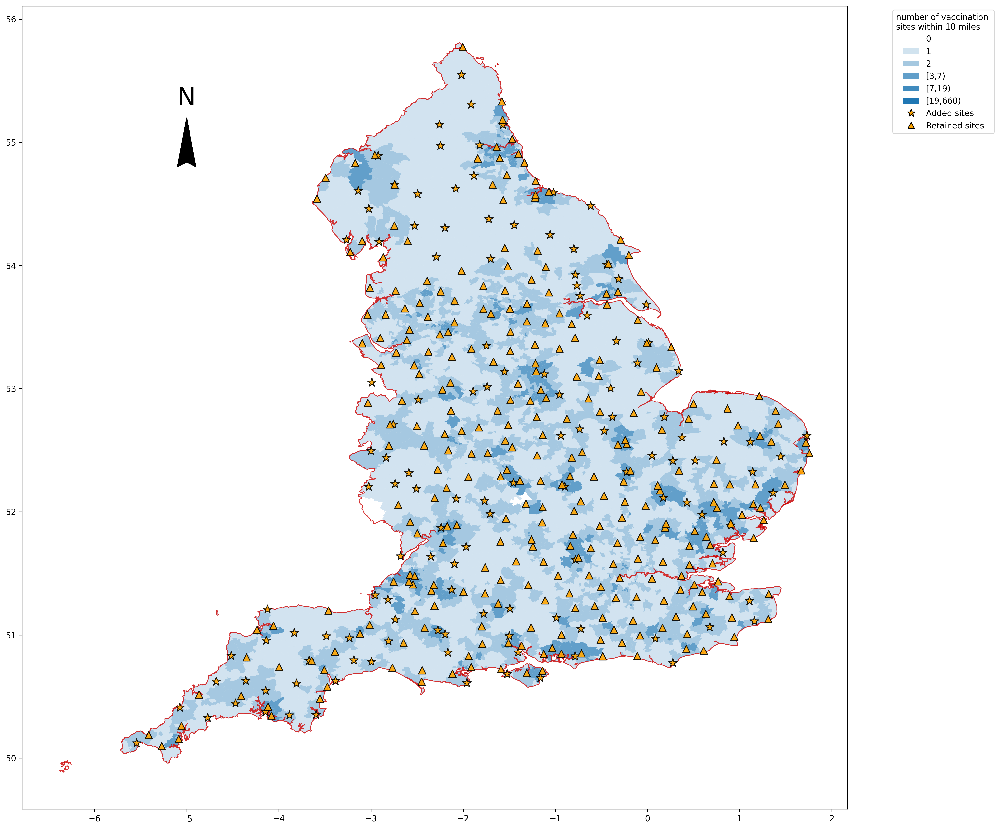

In [ ]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=300)
    legend_elements = []
    tract31.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract32.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract33.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract34.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract35.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract36.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract17.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract18.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8), label='MSOAs with Vaccination Service'))
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),facecolor='none',label='MSOAs Lack of Vaccination Service'))
    facility_points_gdf.plot(ax=ax,
                marker="*",
                markersize=120,
                alpha=0.9,
                zorder=4,
                edgecolor="k",
                facecolor='orange')
    facility_points_gdf2.plot(ax=ax,
                marker="^",
                markersize=80,
                alpha=0.9,
                zorder=4,
                edgecolor="k",
                facecolor='orange')
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  
    legend_elements.append(mlines.Line2D(
        [],
        [],
        color='orange',
        marker='*',
        markersize=10,
        markeredgecolor="k",
        linewidth=0,
        label='Added sites'
        ))
    legend_elements.append(mlines.Line2D(
        [],
        [],
        color='orange',
        marker='^',
        markersize=8,
        markeredgecolor="k",
        linewidth=0,
        label='Retained sites'
        ))    
    plt.gca().set_aspect('auto')
    # plt.title('title', fontweight="bold")
    plt.legend(handles = legend_elements, loc='upper left',title='number of vaccination \nsites within 10 miles',bbox_to_anchor=(1.05, 1))

/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,
/usr/local/lib/python3.7/dist-packages/geopandas/plotting.py:684: UserWarning: The GeoDataFrame you are attempting to plot is empty. Nothing has been displayed.
  UserWarning,


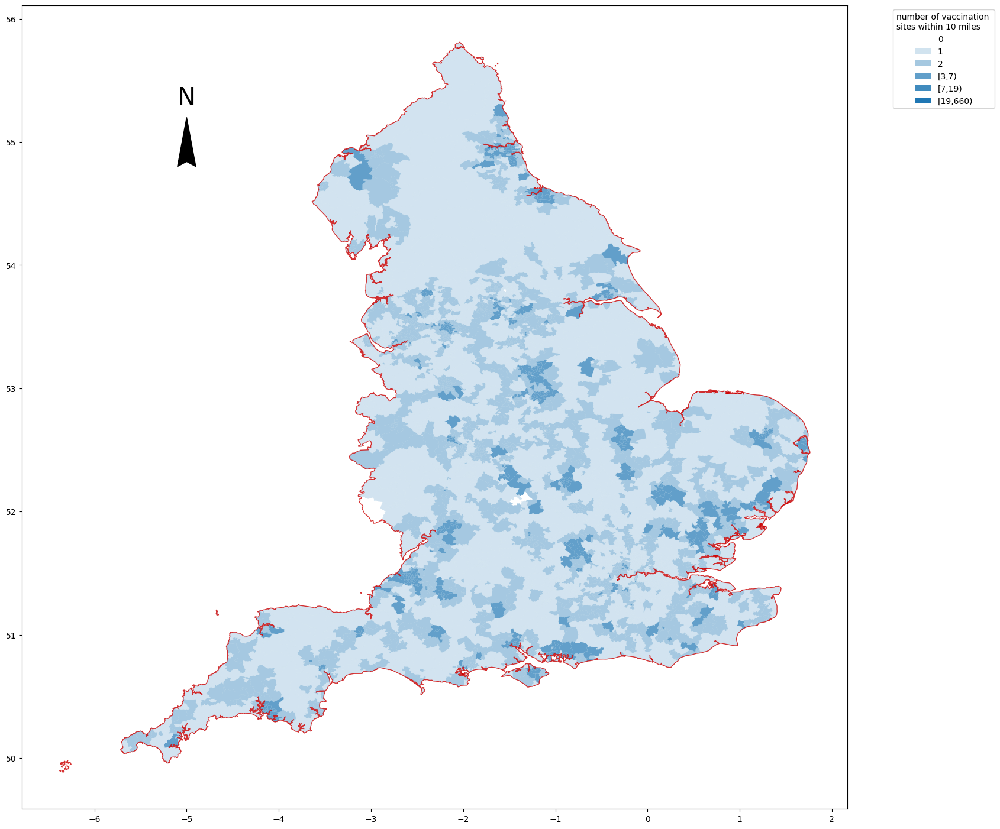

In [ ]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=100)
    legend_elements = []
    tract31.plot(figsize = (18,18),ax=ax,zorder=1,color='none')
    tract32.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.2)
    tract33.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.4)
    tract34.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.7)
    tract35.plot(figsize = (18,18),ax=ax,zorder=1,alpha=0.85)
    tract36.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract17.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    # tract18.plot(figsize = (18,18),ax=ax,zorder=1,alpha=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8), label='MSOAs with Vaccination Service'))
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),facecolor='none',label='MSOAs Lack of Vaccination Service'))
 
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    legend_elements.append(Patch(zorder=2,alpha=0,label='0'))
    legend_elements.append(Patch(zorder=2,alpha=0.2,label='1'))
    legend_elements.append(Patch(zorder=2,alpha=0.4,label='2'))
    legend_elements.append(Patch(zorder=2,alpha=0.7,label='[3,7)'))
    legend_elements.append(Patch(zorder=2,alpha=0.85,label='[7,19)'))
    legend_elements.append(Patch(zorder=2,label='[19,660)'))  

    
    plt.gca().set_aspect('auto')
    # plt.title('title', fontweight="bold")
    plt.legend(handles = legend_elements, loc='upper left',title='number of vaccination \nsites within 10 miles',bbox_to_anchor=(1.05, 1))

#地图2

In [ ]:
demand_points = pandas.read_csv('https://github.com/kdChen07/progress-and-problems/blob/main/data/MSOA380.csv?raw=ture')
demand_points

,index,objectid,msoa11cd,point_lon,point_lat
0,1,311,E02002527,-0.895104,54.556813
1,2,1636,E02002692,-0.900405,53.979796
2,3,1634,E02002693,-0.271017,53.945190
3,4,1632,E02002694,-0.778200,53.931540
4,5,1631,E02002695,-0.168981,53.909875
...,...,...,...,...,...
375,376,6413,E02006845,-2.906422,51.358374
376,377,6410,E02006846,-2.929576,51.347977
377,378,5000,E02006857,0.313122,50.786367
378,379,1484,E02006870,-0.786744,54.132341


In [ ]:
demand_points_gdf = geopandas.GeoDataFrame(
    demand_points,
    geometry=geopandas.points_from_xy(demand_points.point_lon, demand_points.point_lat),
).sort_values(by=['msoa11cd']).reset_index()

In [ ]:
m=demand_points_gdf.drop(['geometry'],axis=1)

In [ ]:
n = pandas.merge(left = tract,right = m, how='right', left_on='MSOA11CD', right_on='msoa11cd')

In [ ]:
n

,MSOA11CD,MSOA11NM,pop0-49,pop50-59,pop60-69,pop70-79,pop80-89,pop90+,total_pop,geometry,level_0,index,objectid,msoa11cd,point_lon,point_lat
0,E02002527,Redcar and Cleveland 013,3094,709,573,484,159,59,5078,"POLYGON ((-0.89730 54.57188, -0.89957 54.56414...",0,1,311,E02002527,-0.895104,54.556813
1,E02002692,East Riding of Yorkshire 009,4692,1490,1303,1090,396,108,9079,"POLYGON ((-0.86687 53.92263, -0.87111 53.92103...",1,2,1636,E02002692,-0.900405,53.979796
2,E02002693,East Riding of Yorkshire 010,3247,1271,1167,1040,372,59,7156,"POLYGON ((-0.21131 54.00579, -0.20984 54.00176...",2,3,1634,E02002693,-0.271017,53.945190
3,E02002694,East Riding of Yorkshire 011,6305,1925,1585,1479,694,136,12124,"POLYGON ((-0.70490 54.00607, -0.72614 54.00029...",3,4,1632,E02002694,-0.778200,53.931540
4,E02002695,East Riding of Yorkshire 012,3631,1197,1366,1367,628,116,8305,"POLYGON ((-0.10074 53.84693, -0.12496 53.84431...",4,5,1631,E02002695,-0.168981,53.909875
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
375,E02006845,North Somerset 026,6772,1147,884,672,320,102,9897,"POLYGON ((-2.84262 51.35541, -2.85650 51.34311...",375,376,6413,E02006845,-2.906422,51.358374
376,E02006846,North Somerset 027,7366,955,506,288,117,17,9249,"POLYGON ((-2.91534 51.34922, -2.93358 51.34443...",376,377,6410,E02006846,-2.929576,51.347977
377,E02006857,Eastbourne 013,4821,1221,1108,1153,521,134,8958,"POLYGON ((0.30640 50.79866, 0.30885 50.79686, ...",377,378,5000,E02006857,0.313122,50.786367
378,E02006870,Ryedale 008,8386,2059,1673,1378,799,190,14485,"POLYGON ((-0.73979 54.17064, -0.73213 54.16706...",378,379,1484,E02006870,-0.786744,54.132341


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  


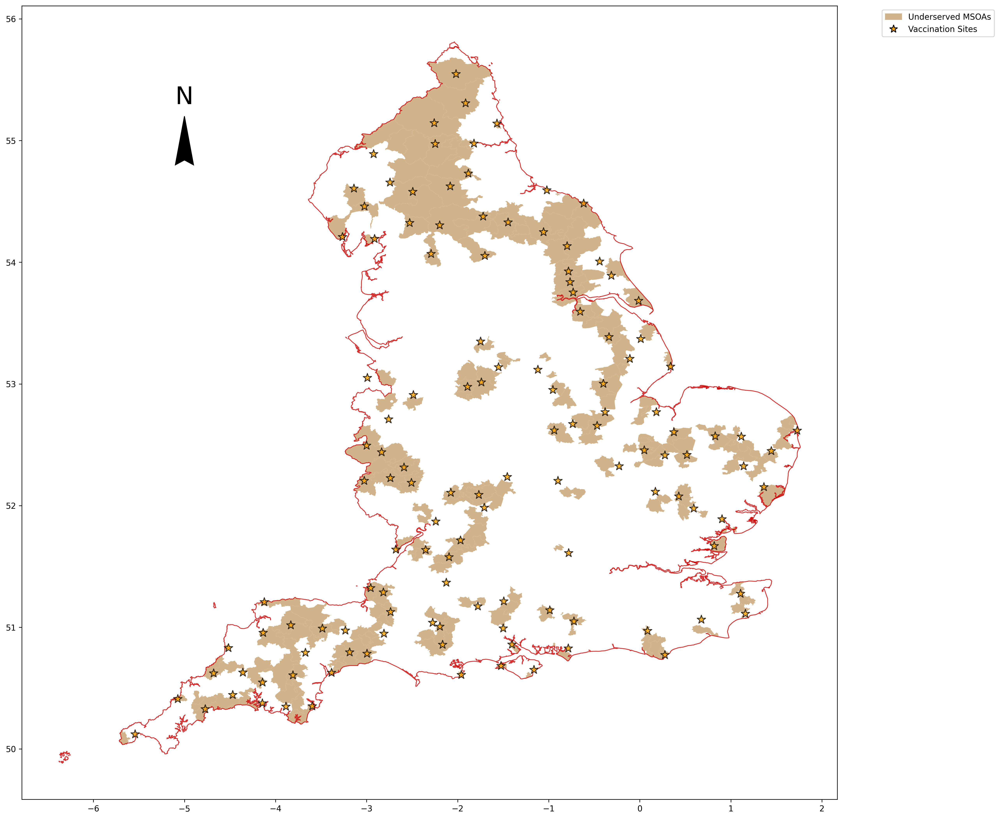

In [ ]:
    fig, ax = plt.subplots(figsize=(18,18),dpi=300)
    legend_elements = []
    n.plot(figsize = (18,18),ax=ax,color='tan',zorder=1)
    MSOA_outline.plot(edgecolor=(0.8, 0, 0,0.8), facecolor='none', linewidth=1,ax=ax)
    facility_points_gdf.plot(ax=ax,marker='*',markersize=120,color='orange',edgecolor="k",alpha=0.8)
    legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),color='tan',label='Underserved MSOAs'))
    # legend_elements.append(Patch(edgecolor=(0.8, 0, 0,0.8),facecolor='none',label='MSOAs with Vaccination Service'))
    legend_elements.append(mlines.Line2D(
        [],
        [],
        color='orange',
        marker='*',
        markersize=10,
        markeredgecolor="k",
        linewidth=0,
        label='Vaccination Sites'
        ))
    ax.text(x=-5.1, y=55.3, s='N', fontsize=30)
    ax.arrow(-5, 55, 0, 0.2, length_includes_head=True,
       head_width=.2, head_length=.4, overhang=.1, facecolor='k')
    plt.gca().set_aspect('auto')
    # plt.title('Map of Underserved MSOAs', fontweight="bold")
    plt.legend(handles = legend_elements, loc='upper left', bbox_to_anchor=(1.05, 1))